# Домашнее задание №2

Задание присылать на обе почты почты aleksartamonov@gmail.com dashkov.alexander.om@gmail.com в виде ссылки на colab

В теме письма указать **CV_HSE_2021 HW1 <Фамилия Имя>**

soft deadline: 14.03.2021T23:59:00+0300

hard deadline: 21.03.2021T23:59:00+0300

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
%cd /content/drive/MyDrive/hw2

/content/drive/.shortcut-targets-by-id/1Q4WEGTjMUD6PL7F_jH_xsHpf9R0XT5j6/hw2


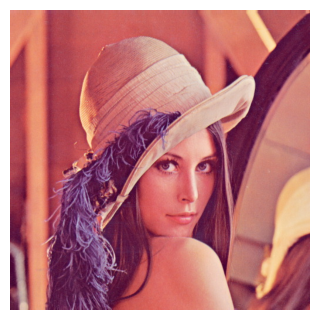

In [3]:
import cv2
import matplotlib.pylab as plt
import numpy as np
import ipywidgets as widgets
from ipywidgets import interactive
from IPython.display import display, clear_output
import os
%matplotlib inline
plt.style.use('default')

def show(img, size=3):
    plt.figure(figsize=(size,size))
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

lena = cv2.imread("lena.jpg")
show(lena)

**1. (6 баллов)** С помощью [виджетов](http://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html) создайте 2 слайдера с настройками параметров гамма-коррекции. Отобразите **lena**, ее гамма-преобразование и график в диапозоне от [0;1], так, чтобы параметры слайдера соответствовали параметрам гамма-коррекции. 

In [4]:
def gamma_correction(image, c, gamma):
    table = np.array([255 * c * (i / 255.0) ** (1.0 / gamma) for i in range(0, 256)]).clip(0,255).astype('uint8')
    return cv2.LUT(image, table)

def plot_gamma_curve(c, gamma):
    x = np.linspace(0, 1, 100)
    y = c * x ** gamma

    plt.plot(x, y, label='gamma')
    plt.plot(x, x, label='image')
    plt.title(f'{c} * x ^ {gamma}')
    plt.legend()
    plt.show()

In [5]:
def gamma_image(c, gamma):
    gamma_lena = gamma_correction(lena, c, gamma)

    lena_stacked = np.hstack([lena, gamma_lena])

    show(lena_stacked, size=6)
    plot_gamma_curve(c, gamma)

In [6]:
interactive(gamma_image, c=(0, 1, 0.1), gamma=(0, 5, 0.1))

interactive(children=(FloatSlider(value=0.0, description='c', max=1.0), FloatSlider(value=2.0, description='ga…

**2. (5 баллов)** Загрузите изображение $lena.jpg$. Переведите изображение в градации серого. Примените к серому изображению операцию линейного растяжения диапазона яркостей ($normalize$) и эквализации гистограммы ($equalizeHist$). Постройте разность полученных результатов. Состыкуйте в одно изображение в градациях серого результат линейного растяжения, эквализации и их разности.

In [7]:
def normalize(image):
    y_min, y_max = image.min(), image.max()
    new_image = ((image - y_min) / (y_max - y_min) * 255).astype('uint8')
    
    return new_image

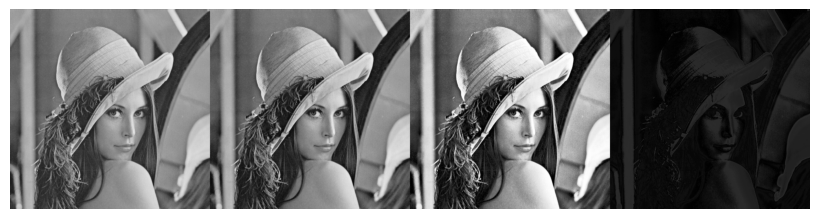

In [8]:
lena_gray = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
lena_norm = normalize(lena_gray)
lena_equal = cv2.equalizeHist(lena_gray)
lena_dif = cv2.absdiff(lena_equal, lena_norm)

lena_stacked = np.hstack([lena_gray, lena_norm, lena_equal, lena_dif])

show(lena_stacked, size=8)

**3. (5 баллов)** Реализуйте функцию добавления шума «соль и перец» для одноканального изображения. Входные параметры: $src$ – исходная одноканальная матрица $Mat$, $p$ – вероятность замещения исходных значений на $0$, $q$ – вероятность замещения исходных значений на $255$. Загрузите изображение $lena.jpg$, выделите каналы изображения в отдельные матрицы ($split$), добавьте шум «соль и перец» в каждый канал при помощи реализованной Вами функции с параметрами

1. $p=q=0.05$
2. $p=q=0.1$
3. $p=q=0.15$

In [9]:
def salt_pepper(src, p=0.05, q=0.05):
    new_src = src.copy()

    n = src.shape[0] * src.shape[1]
    n_p = int(n * p)
    n_q = int(n * q)

    for i in range(n_p):
        y = np.random.randint(0, src.shape[0])
        x = np.random.randint(0, src.shape[1])

        new_src[y, x] = 0

    for i in range(n_q):
        y = np.random.randint(0, src.shape[0])
        x = np.random.randint(0, src.shape[1])

        new_src[y, x] = 255

    return new_src

In [10]:
def add_noice(image, p=0.05, q=0.05):
    r, g, b = cv2.split(image)

    new_r = salt_pepper(r, p, q)
    new_g = salt_pepper(g, p, q)
    new_b = salt_pepper(b, p, q)

    new_image = cv2.merge([new_r, new_g, new_b])
    return new_image

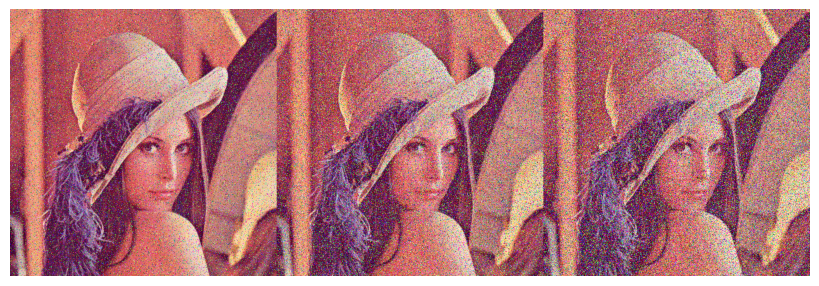

In [11]:
lena_1 = add_noice(lena, 0.05, 0.05)
lena_2 = add_noice(lena, 0.1, 0.1)
lena_3 = add_noice(lena, 0.15, 0.15)

lena_stacked = np.hstack([lena_1, lena_2, lena_3])
show(lena_stacked, size=8)

**4. (5 баллов)** Удалите диагональные полоски с изображения $lena\_diagonal.jpg$. Вычислите среднеквадратичную ошибку (mean squared error, $MSE$) для полученного результата и изображения $lena\_gray\_512.tif$. Задача будет засчитана при $MSE < 1500$. Тот, у кого по результатам проверки будет наименьшее значение MSE среди всех студентов для этой задачи, получит призовую шоколадку (раньше мы раздавали призовые баллы, но теперь у нас концепция фиксированного максимального количества баллов)

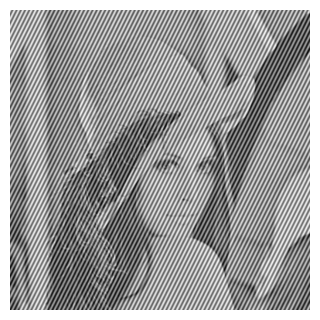

In [12]:
img = cv2.imread("lena_diagonal.jpg")
true_img = cv2.imread('lena_gray_512.tif')

show(img)

975.2541732788086


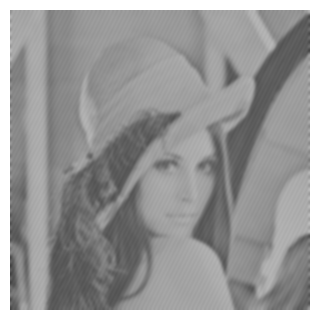

In [13]:
unnoiced_img = img.copy()

unnoiced_img = cv2.GaussianBlur(unnoiced_img, (15, 15), 0)

mse = np.mean((unnoiced_img.astype('int') - true_img.astype('int')) ** 2)
print(mse)

show(unnoiced_img)

**5. (5 баллов)** Подавите шум на изображении $lena\_color\_512\_noise.tif$. Вычислите среднеквадратичную ошибку ($MSE$) для полученного результата и изображения $lena\_color\_512.tif$. Задача будет засчитана при $MSE < 150$. Тот, у кого по результатам проверки будет наименьшее значение $MSE$ среди всех студентов для этой задачи, получит призовую шоколадку.

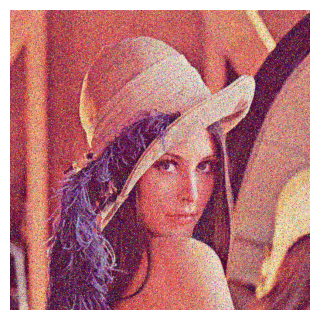

In [14]:
img = cv2.imread("lena_color_512-noise.tif")
true_img = cv2.imread('lena_color_512.tif')

show(img)

120.42697397867839


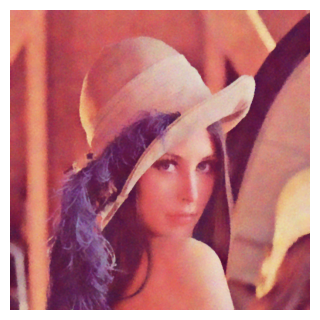

In [15]:
unnoiced_img = img.copy()

unnoiced_img = cv2.bilateralFilter(unnoiced_img, 19, 100, 100)
unnoiced_img = cv2.medianBlur(unnoiced_img, 3)

mse = np.mean((unnoiced_img.astype('int') - true_img.astype('int')) ** 2)
print(mse)

show(unnoiced_img)

**6. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно быть изображение, в котором удален весь текст и оставлены только границы таблицы

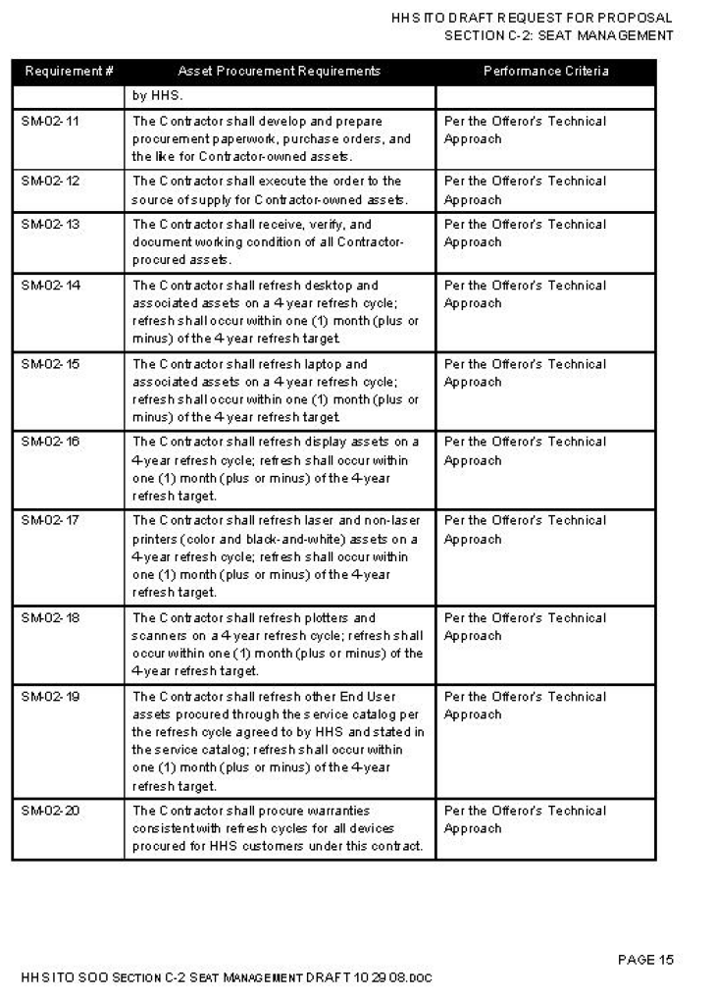

In [16]:
table = cv2.imread("table.jpg")
show(table, size=10)

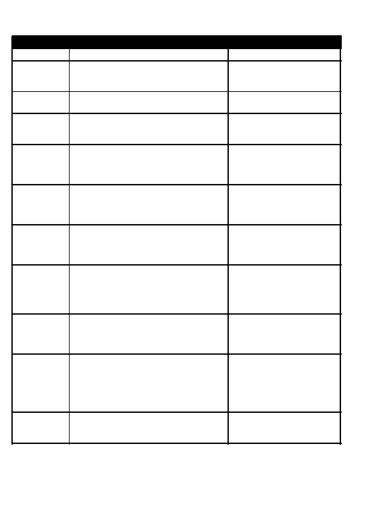

In [17]:
new_table = table.copy()

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
new_table = cv2.erode(new_table, kernel, iterations=1)
new_table = cv2.dilate(new_table, kernel, iterations=1)

gray = cv2.cvtColor(new_table, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

kernel_vert = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 30))
vertical = cv2.erode(thresh, kernel_vert, iterations=1)
vertical = cv2.dilate(vertical, kernel_vert, iterations=1)

kernel_hor = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 1))
horizontal = cv2.erode(thresh, kernel_hor, iterations=1)
horizontal = cv2.dilate(horizontal, kernel_hor, iterations=1)

new_table = 255 - cv2.bitwise_or(vertical, horizontal)

show(new_table, size=5)

**7. (5 баллов)** Отделите монеты от фона на изображении $coins\_1.jpg$, отсортируйте монеты по убыванию размера. Сгенерируйте результирующее изображение с цветной разметкой областей, соответствующих монетам на исходном изображении: на черном фоне должны быть выделены разными цветами области, соответствующие монетам. В центре каждой выделенной области разместите порядковый номер монеты в соответствии с сортировкой монет по размеру (в центре области, соответствующей самой большой монете, должно стоять число 1)

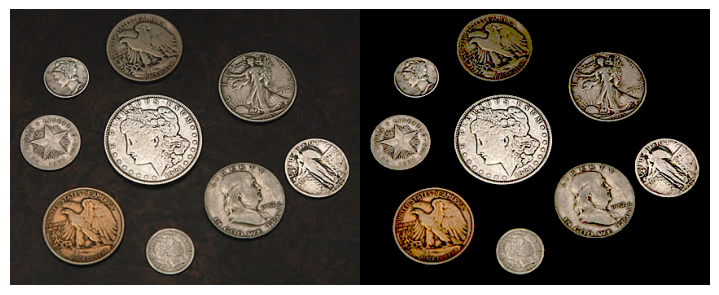

In [18]:
coins_1 = cv2.imread("coins_1.jpg")

no_back = coins_1.copy()
no_back[no_back < 79] = 0

coins_stacked = np.hstack([coins_1, no_back])

show(coins_stacked, size=7)

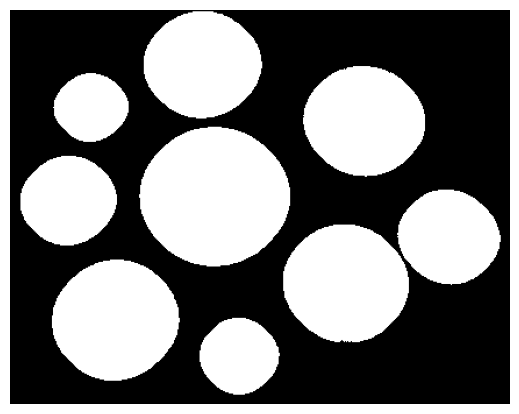

In [19]:
thresh = cv2.cvtColor(no_back, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(thresh, 0, 255, cv2.THRESH_BINARY)[1]

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
new_img = cv2.erode(thresh, kernel, iterations=1)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
new_img = cv2.dilate(new_img, kernel, iterations=5)

show(new_img, size=5)

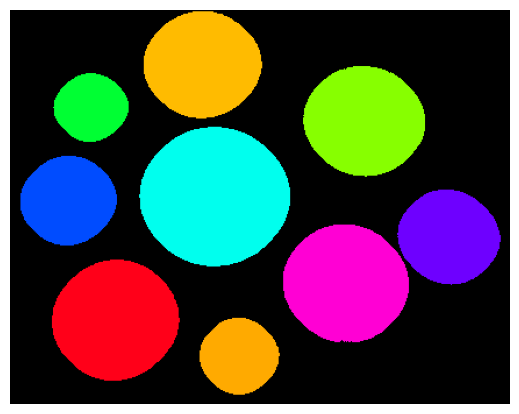

In [20]:
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(new_img)
areas = stats.T[4]
centroids = centroids.astype('int32')

label_hue = (200 * labels / np.max(labels)).astype('uint8')
blank_ch = 255 * np.ones_like(label_hue)

labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)
labeled_img[label_hue == 0] = 0

show(labeled_img, size=5)

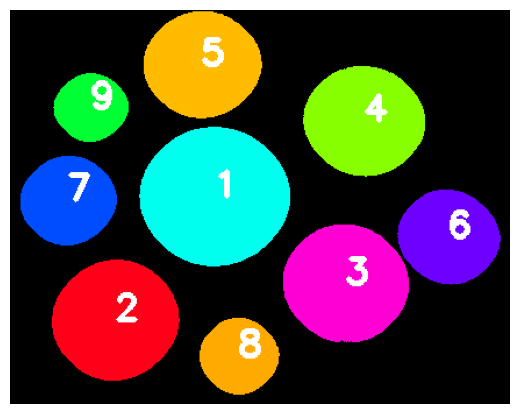

In [21]:
ordered_labels = {k: v for k, v in zip(np.argsort(areas)[::-1], np.arange(len(labels)))}

number_img = labeled_img.copy()

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 1
fontColor = (255, 255, 255)
lineType = 3

for label in range(1, num_labels):
    number = ordered_labels[label]
    x, y = centroids[label]

    number_img = cv2.putText(number_img, str(number), (x, y), 
                             font, fontScale, fontColor, lineType)

show(number_img, size=5)

**8. (5 баллов)** Отделите монеты от текста на изображении $coins\_2.jpg.$ Сгенерируйте по входному изображению два изображения: на одном должны остаться только монеты, весь текст должен быть удален; на втором изображении должен остаться только текст, все монеты должны быть удалены.

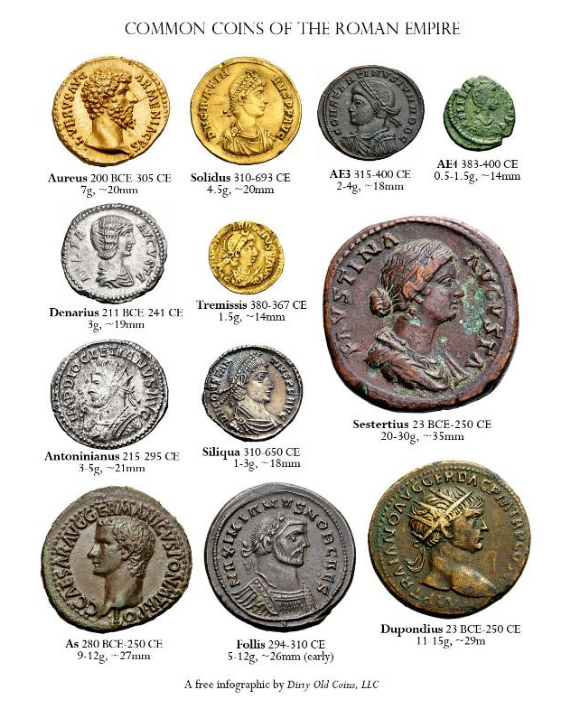

In [22]:
coins_2 = cv2.imread("coins_2.jpg")
show(coins_2, size=7)

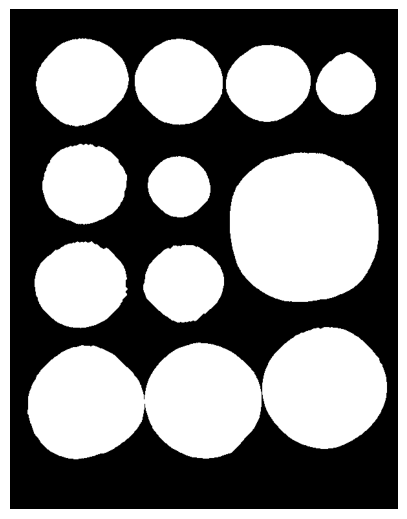

In [23]:
new_img = cv2.cvtColor(coins_2, cv2.COLOR_BGR2GRAY)
new_img = cv2.threshold(new_img, 240, 255, cv2.THRESH_BINARY_INV)[1]

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
new_img = cv2.morphologyEx(new_img, cv2.MORPH_OPEN, kernel)
new_img = cv2.morphologyEx(new_img, cv2.MORPH_CLOSE, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
new_img = cv2.morphologyEx(new_img, cv2.MORPH_OPEN, kernel, iterations=3)
new_img = cv2.dilate(new_img, kernel, iterations=6)
new_img = cv2.morphologyEx(new_img, cv2.MORPH_OPEN, kernel, iterations=3)

new_img = cv2.cvtColor(new_img, cv2.COLOR_GRAY2BGR)
show(new_img, size=5)

[  0 255]


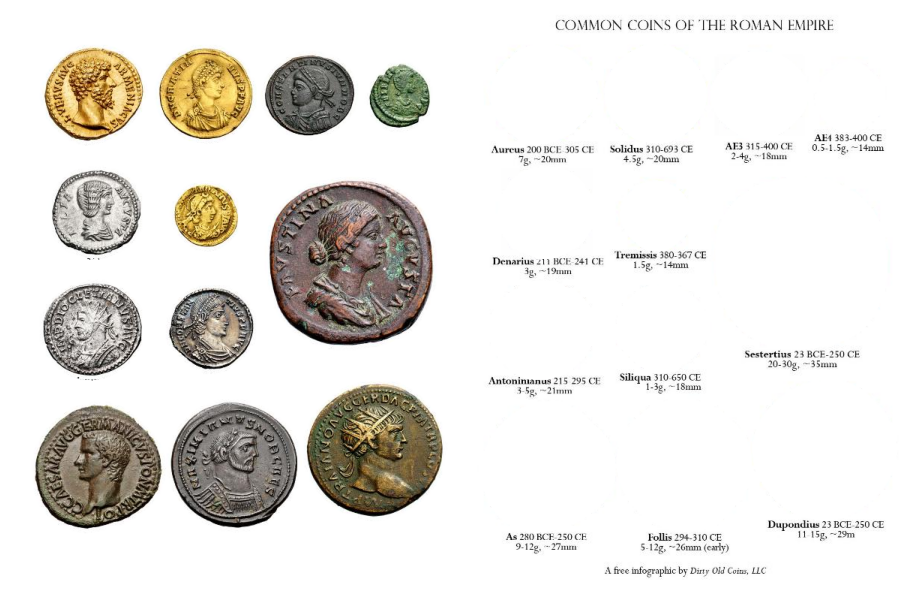

In [24]:
print(np.unique(new_img))
mask = new_img.copy()
inv_mask = cv2.bitwise_not(mask)

only_coins = cv2.subtract(mask, coins_2)
only_coins = cv2.bitwise_not(only_coins)

only_text = cv2.subtract(inv_mask, coins_2)
only_text = cv2.bitwise_not(only_text)


stacked_imgs = np.hstack([only_coins, only_text])
show(stacked_imgs, size=9)

### Сравнение глобальных признаков 

Для задач 9 и 10 надо реализовать общую функцию, которая принимет на вход:

* список дескрипторов (**id**, и сам дескриптор) 
* количество максимально похожих для вывода **n**
* функцию сранения дескрипторов

и отдает **n** пар **id** максимально похожих изображений.

**9. (9 баллов)** Посмотрите на изображения в папке *Coral*. Посчитайте гистограммы изображений.  В этом задании надо попробовать:
* различные цветовые пространства (RGB, HSV, CIELab)
* различные способы разбиения на бины (разное количество для каждой характеристики)
* различные метрики сравнения $L_2$, $\chi^2$, пересечение гистограм

В итоге нужно сделать мини отчет по тому, какой метод раотает лучше. И в конце выведите на экран 20 пар изображений с максимально похожими гистограммами, которые получаются этим методом.

In [25]:
def show_pair(img_1, img_2, size=5):
    f = plt.figure(figsize=(size,size))

    f.add_subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    f.add_subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB))

    plt.axis('off')
    plt.show(block=True)

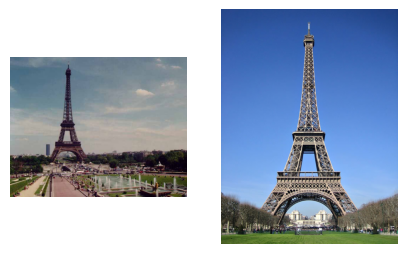

In [26]:
path = 'datasets/Corel/'

img_1 = cv2.imread(path + "eiffel.jpg")
img_2 = cv2.imread(path + "eiffel-tower-day.jpg")

show_pair(img_1, img_2)

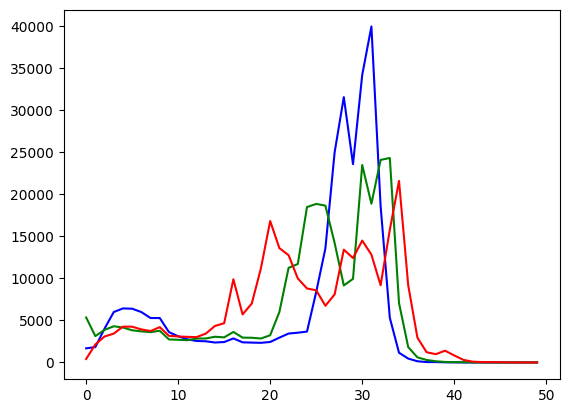

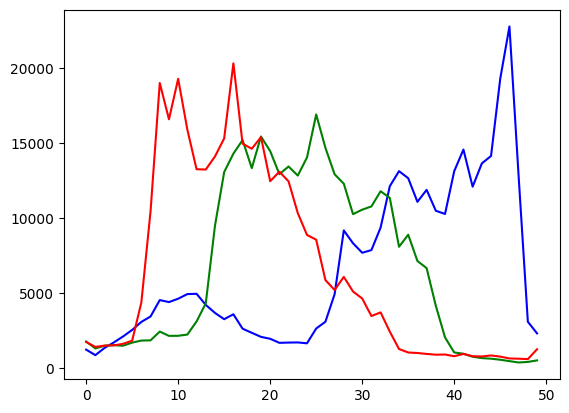

In [27]:
def plot_rgb_hist(img, bins=256):
    color = ('b','g','r')
    plt.figure()
    for i, col in enumerate(color):
        histr = cv2.calcHist([img], [i], None, [bins], [0, 256])
        plt.plot(histr, color = col)
    
    plt.show()

plot_rgb_hist(img_1, 50) 
plot_rgb_hist(img_2, 50) 

In [28]:
def inter_dist(img_hist_1, img_hist_2):
    hist_stack = np.vstack([img_hist_1, img_hist_2]).T
    result = 1 - np.sum(hist_stack.min(axis=1))

    return result

def chi2_dist(img_hist_1, img_hist_2):
    result = 0.5 * np.sum((img_hist_1 - img_hist_2) ** 2 / (img_hist_1 + img_hist_2 + 1e-15))

    return result

def l2_dist(img_hist_1, img_hist_2):
    result = np.mean((img_hist_1 - img_hist_2) ** 2)

    return result

def find_distance(img_1, img_2, bins=100, dist='chi-squared', color='rgb'):
    if dist == 'intersection':
        dist_function = inter_dist
    elif dist == 'chi2':
        dist_function = chi2_dist
    elif dist == 'l2':
        dist_function = l2_dist

    if color == 'rgb':
        img_1_color = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
        img_2_color = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)
    elif color == 'hsv':
        img_1_color = cv2.cvtColor(img_1, cv2.COLOR_BGR2HSV)
        img_2_color = cv2.cvtColor(img_2, cv2.COLOR_BGR2HSV)
    elif color == 'cie':
        img_1_color = cv2.cvtColor(img_1, cv2.COLOR_BGR2Lab)
        img_2_color = cv2.cvtColor(img_2, cv2.COLOR_BGR2Lab)

    final_distance = 0
    colors = [0, 1, 2]

    for i in colors:
        img_hist_1 = cv2.calcHist([img_1_color], [i], None, [bins], [0, 256]).reshape(1, -1)[0]
        img_hist_1 = img_hist_1 / np.sum(img_hist_1)

        img_hist_2 = cv2.calcHist([img_2_color], [i], None, [bins], [0, 256]).reshape(1, -1)[0]
        img_hist_2 = img_hist_2 / np.sum(img_hist_2)

        distance = dist_function(img_hist_1, img_hist_2)
        final_distance += distance / len(colors)

    return final_distance

In [29]:
import os

imgs = os.listdir(path)
distances = []

read_imgs = []
for image in imgs:
    img = cv2.imread(path + image)
    read_imgs.append(img)

In [30]:
def n_best_images(read_imgs, n_best=20, n_bins=100, dist='chi2', color='rgb'):
    distances = []
    
    for i in range(len(read_imgs)):
        for j in range(i + 1, len(read_imgs)):
            img_1 = read_imgs[i]
            img_2 = read_imgs[j]

            distance = find_distance(img_1, img_2, bins=n_bins, dist=dist, color=color)
            distances.append((i, j, distance))

    sorted_dist = sorted(distances, key=lambda x: x[2])

    return sorted_dist[:n_best]

def show_n_best(n_best, read_imgs):
    for i, j, _ in n_best:
        show_pair(read_imgs[i], read_imgs[j])

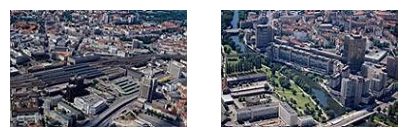

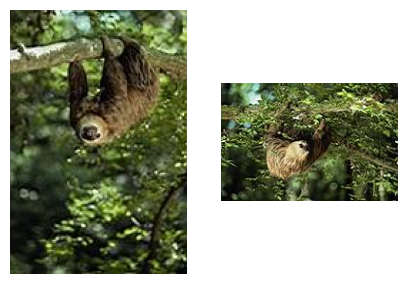

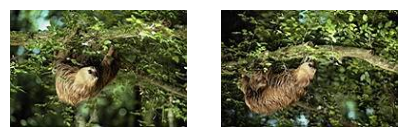

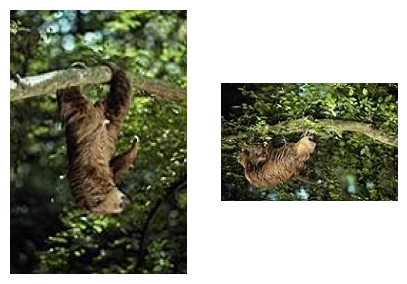

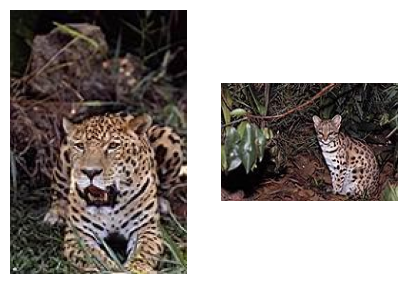

In [31]:
show_n_best(n_best_images(read_imgs, 5, n_bins=100), read_imgs)

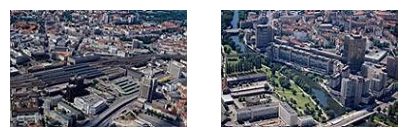

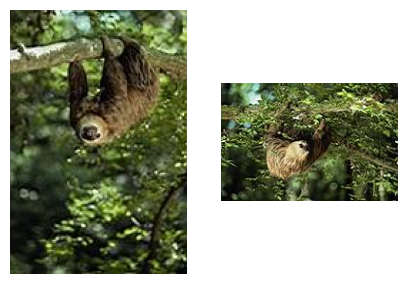

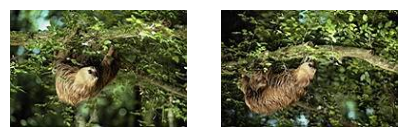

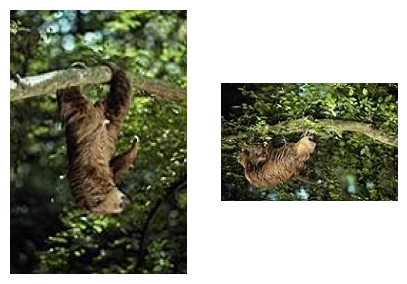

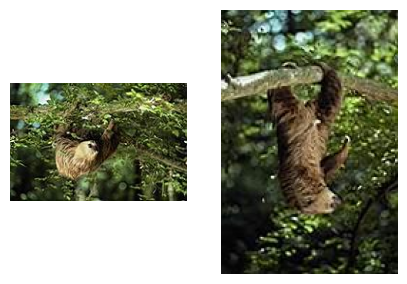

In [32]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250), read_imgs)

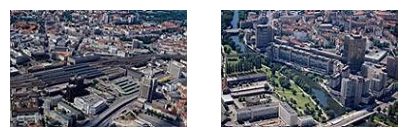

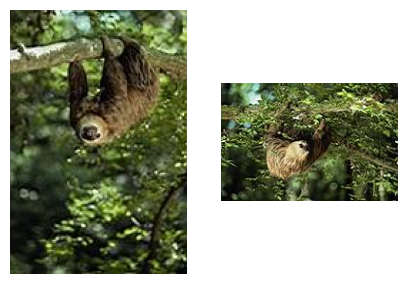

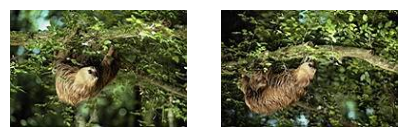

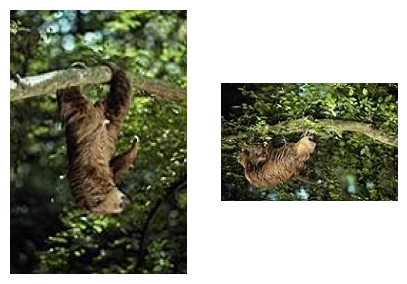

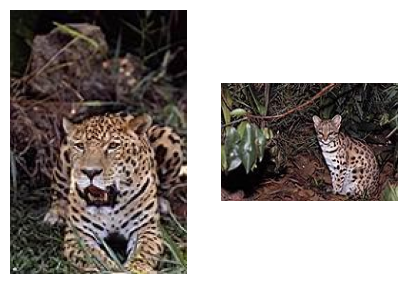

In [33]:
show_n_best(n_best_images(read_imgs, 5, n_bins=50), read_imgs)

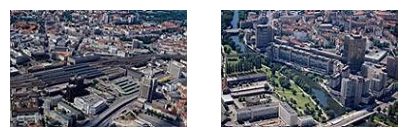

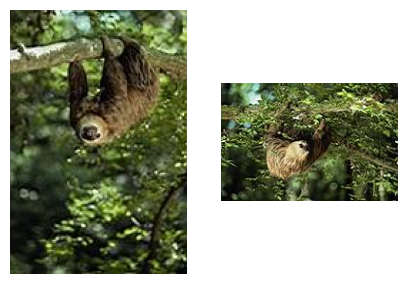

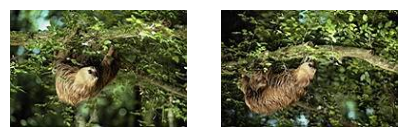

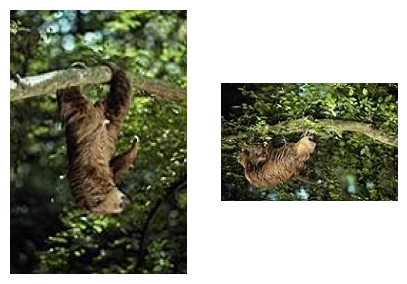

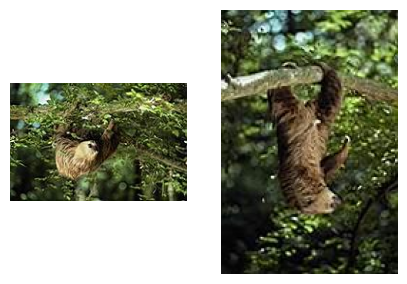

In [34]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='intersection'), read_imgs)

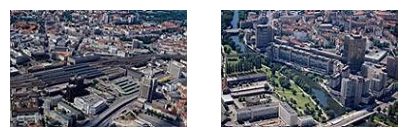

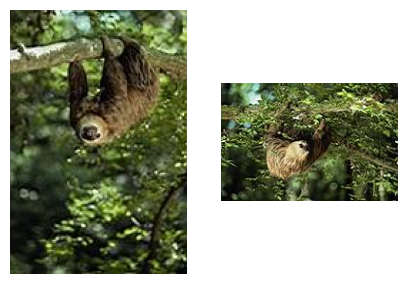

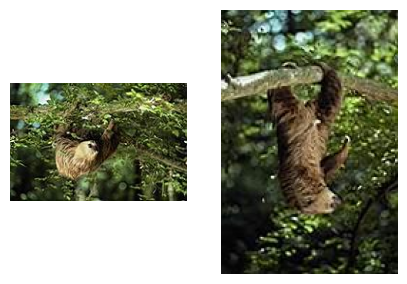

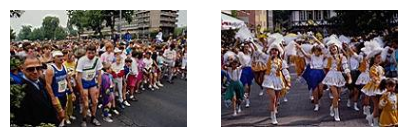

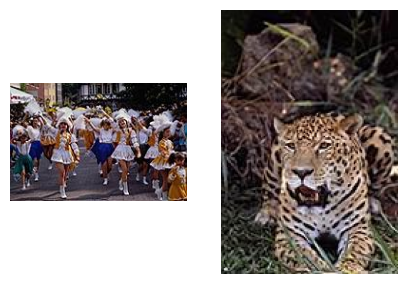

In [35]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='l2'), read_imgs)

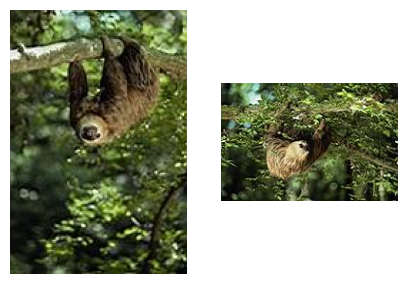

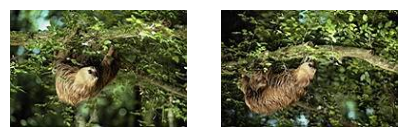

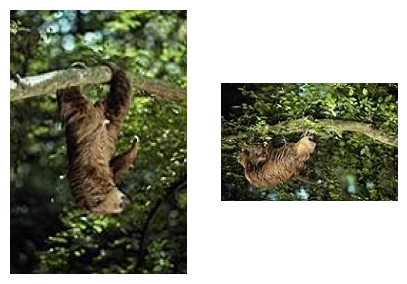

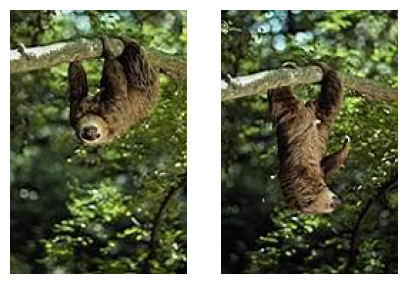

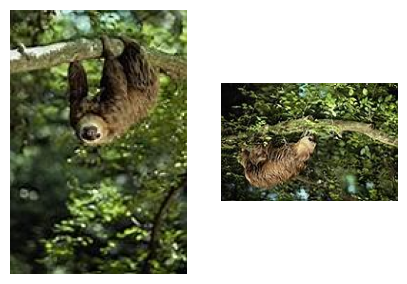

In [36]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='chi2', color='hsv'), read_imgs)

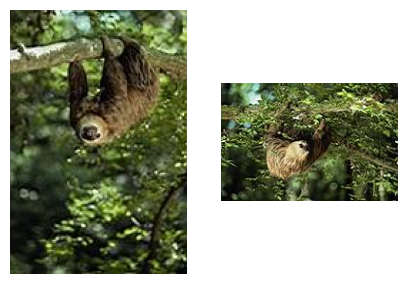

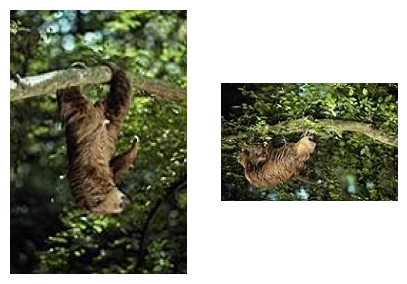

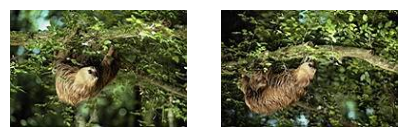

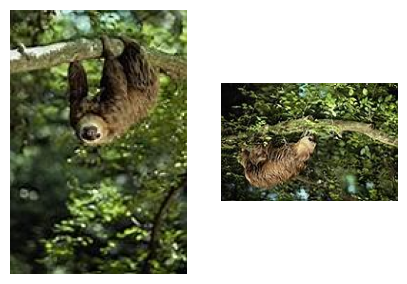

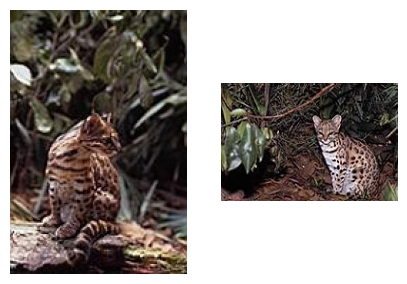

In [37]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='intersection', color='cie'), read_imgs)

Best:

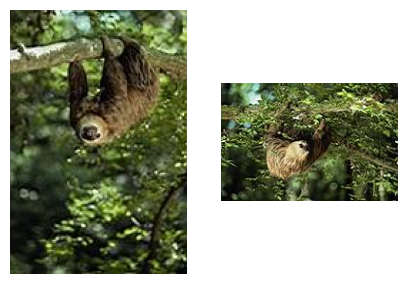

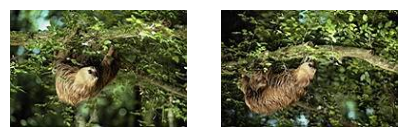

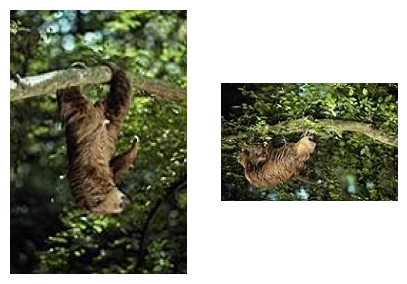

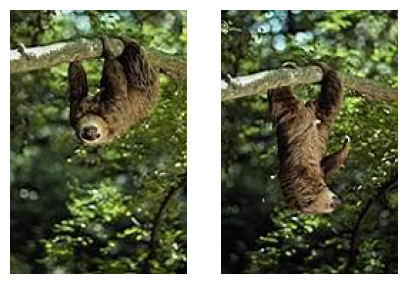

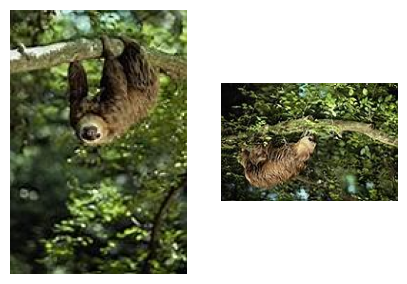

...

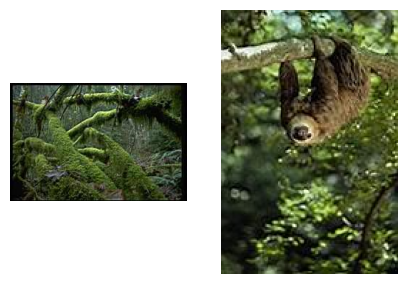

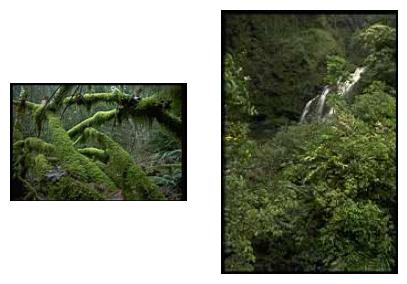

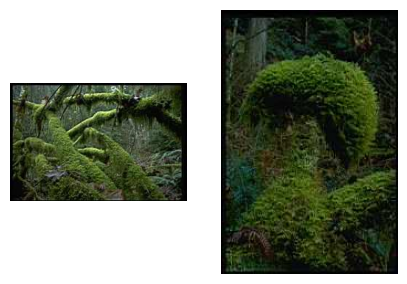

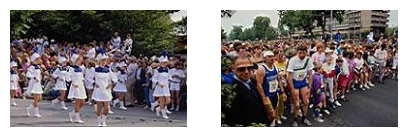

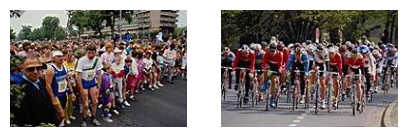

In [38]:
show_n_best(n_best_images(read_imgs, 20, n_bins=250, dist='chi2', color='hsv'), read_imgs)

**10. (10 баллов)** Посмотрите на изображения в папке *leaves*. Посчитайте дескрипторы Фурье для каждого листочка изображений. Выведите на экран 20 пар изображений с максимально похожими дескрипторами.

In [39]:
!ls datasets/leaves

be10.tif  be9.tif   ce8.tif  ge3.tif  ke3.tif	le8.tif   me7.tif   pe4.tif
be1.tif   ce10.tif  ce9.tif  he1.tif  le10.tif	le9.tif   me8.tif   pe5.tif
be2.tif   ce1.tif   de1.tif  he2.tif  le1.tif	me10.tif  me9.tif   pe6.tif
be3.tif   ce2.tif   de2.tif  he3.tif  le2.tif	me1.tif   pe10.tif  pe7.tif
be4.tif   ce3.tif   de3.tif  ie1.tif  le3.tif	me2.tif   pe11.tif  pe8.tif
be5.tif   ce4.tif   de4.tif  ie2.tif  le4.tif	me3.tif   pe12.tif  pe9.tif
be6.tif   ce5.tif   de5.tif  ie3.tif  le5.tif	me4.tif   pe1.tif
be7.tif   ce6.tif   ge1.tif  ke1.tif  le6.tif	me5.tif   pe2.tif
be8.tif   ce7.tif   ge2.tif  ke2.tif  le7.tif	me6.tif   pe3.tif


In [40]:
path = 'datasets/leaves/'

imgs = os.listdir(path)
distances = []

read_imgs = []
for image in imgs:
    img = cv2.imread(path + image)
    read_imgs.append(img)

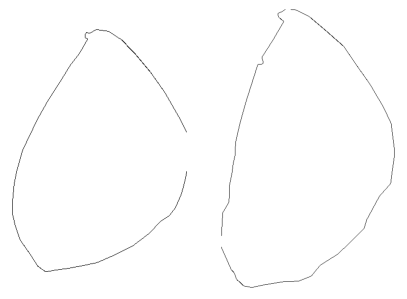

In [41]:
img_1 = cv2.imread(path + 'be10.tif')
img_2 = cv2.imread(path + 'be2.tif')

show_pair(img_1, img_2, size=5)

In [42]:
def fourier_descriptor(img, coef_number = 20):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    coordinates = np.column_stack(np.where(img_gray == 0))
    center = coordinates.mean(axis=0).astype('int')
    center_difference = coordinates - center

    distances = np.linalg.norm(center_difference, axis=1)
    angles = np.arccos(center_difference[:, 1] / distances)
    
    angles[center_difference[:, 0] > 0] = 2*np.pi - angles[center_difference[:, 0] > 0]
    indeces = np.argsort(angles)

    distances = distances[indeces]
    
    N = len(distances)
    t = np.arange(N)
    coefs = np.abs(np.array(
        [distances.dot(np.exp(-np.complex(0,1) * 2 * np.pi * n * t / N)) / N for n in range(coef_number + 1)]
        ))

    coefs = (coefs / coefs[0])[1:]
    return coefs

def fourier_mse(f1, f2):
    return np.sqrt(np.sum((f1 - f2) ** 2))

In [43]:
def n_best_images_fourier(read_imgs, n_best=20, n_coef=10):
    distances = []
    
    for i in range(len(read_imgs)):
        for j in range(i + 1, len(read_imgs)):
            img_1 = read_imgs[i]
            img_2 = read_imgs[j]

            f1 = fourier_descriptor(img_1, n_coef)
            f2 = fourier_descriptor(img_2, n_coef)

            distance = fourier_mse(f1, f2)
            distances.append((i, j, distance))

    sorted_dist = sorted(distances, key=lambda x: x[2])

    return sorted_dist[:n_best]

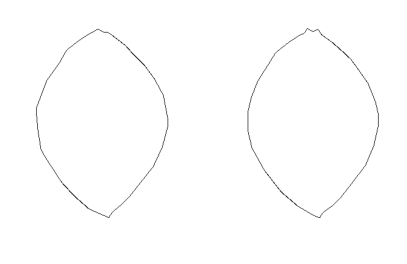

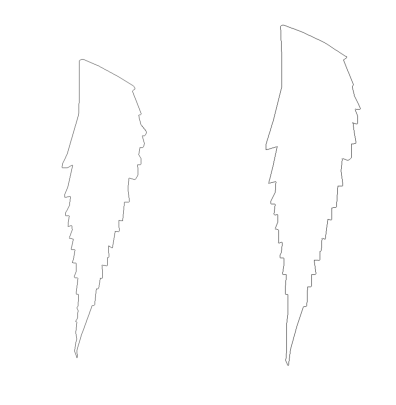

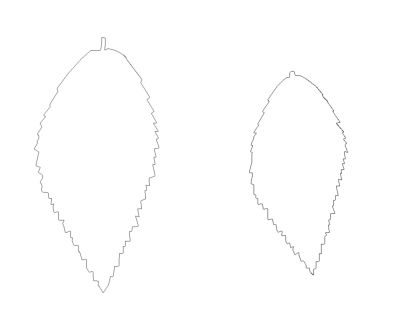

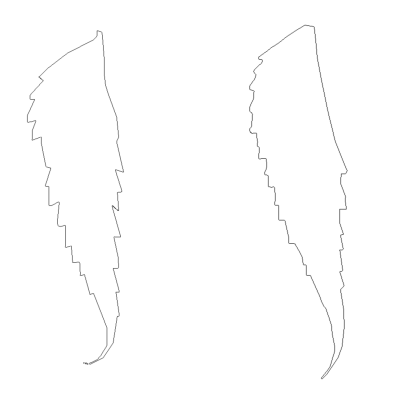

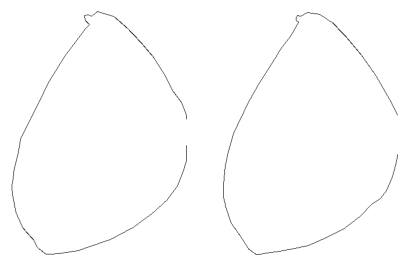

...

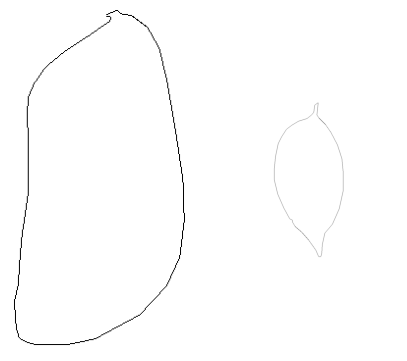

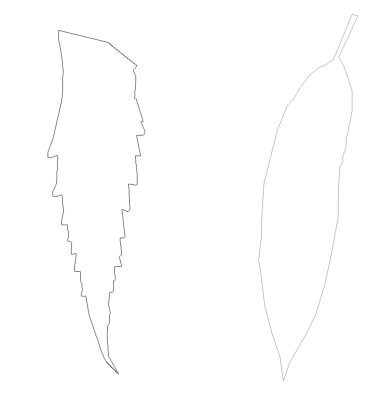

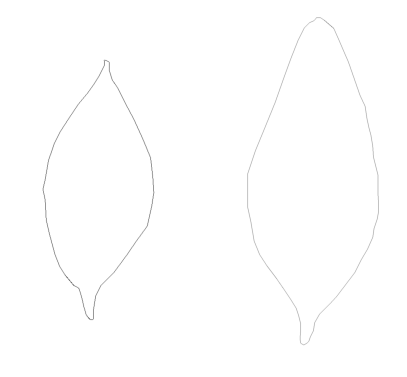

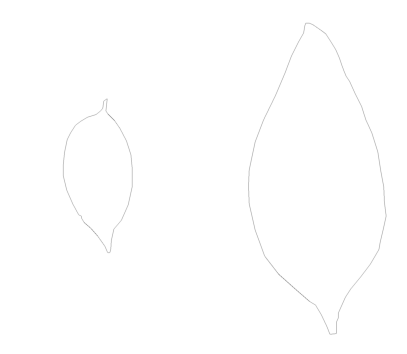

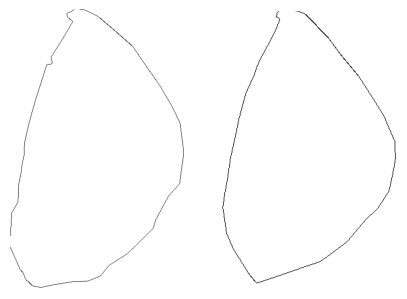

In [44]:
show_n_best(n_best_images_fourier(read_imgs, 20, n_coef=10), read_imgs)